# Practical work 5: edge detection

The goal of this practial work is to experiment various edge detectors. Attention is given to the following points:
1. comparison between the first and second order detectors
2. study of the impact of smoothing
3. removing non maxima answers of the detectors
4. evaluation in term of robustness and localization

In [2]:
from TME1 import openImage, thresholdImage
from TME2 import toVisualizeFT, toVisualizeLogFT, computeFT

In [3]:
# Useful modules
import numpy as np
from PIL import Image
from scipy.signal import convolve2d
import matplotlib.pyplot as plt

# Useful functions for this work
def orientation(Ix, Iy, Ig):
    """ Array[n,m]**3 -> Array[n,m]
        Returns an image of orientation.
    """
    n, m = Ix.shape
    x = np.arange(4)*np.pi/4
    ori = np.stack((np.cos(x), np.sin(x)), axis=1)
    O = np.zeros(Ix.shape)
    for i in range(n):
        for j in range(m):
            if Ig[i, j] > 0:
                v = np.array([Ix[i, j], -Iy[i, j]])/Ig[i, j]
                if Iy[i, j] > 0: v = -v
                prod = np.matmul(ori, v)
                maxi = prod.max()
                imax = np.nonzero(prod == maxi)
                O[i, j] = imax[0][0]+1
    return O

def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = np.int(np.ceil(3*sigma))
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern =  np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return kern/kern.sum()


def imshow(I, title=None, size=500, axis=False):
    """ display an image, with title, size, and axis """
    plt.figure(figsize=(size//80, size//80))
    plt.gray()
    plt.imshow(I)
    if not axis: plt.axis('off')
    if title: plt.title(title)
    plt.show()

def imshow_hot(I, title=None, size=500, axis=False):
    """ display an image, with title, size, and axis """
    plt.figure(figsize=(size//80, size//80))
    plt.hot()
    plt.imshow(I)
    if not axis: plt.axis('off')
    if title: plt.title(title)
    plt.show()

def niceDisplay14(affichages,titres=None):
    """ list[Array]*list[str] -> NoneType
        display from 1 up to 4 images or vectors with optionnal titles
        2D arrays are displayed as image with imshow()
        1D arrays are displayed as curve with plot()
    """
    if not type(affichages) == type([]):
        affichages = [affichages]
        
    if titres is None:
        titres = ['',]*len(affichages)
        
    if not type(titres) == type([]):
        titres = [titres]
    
    nb_affichages = len(affichages)
    if nb_affichages >4 or nb_affichages < 1 :
        raise ValueError('niceDisplay_14 : affichage should be a list of length 1 up to 4')
        
    if nb_affichages != len(titres):
        raise ValueError('niceDisplay_14 : titres must have same length than affichage')
        
    courbes = False
    for i in range(0,nb_affichages):
        s = plt.subplot(101+10*nb_affichages+i)
        s.set_title(titres[i])
        if len(affichages[i].shape)==2 and affichages[i].shape[0] > 1 and affichages[i].shape[1] > 1:
            # on affiche une image
            s.imshow(affichages[i], cmap="gray",interpolation='nearest', aspect='equal')
        else :
            # il s'agit d'une seule ligne, à afficher comme une courbe
            plt.plot(affichages[i])
            courbes=True

    agrandissement_h = nb_affichages
    agrandissement_v = nb_affichages*2 if courbes else nb_affichages
    params = plt.gcf()
    plSize = params.get_size_inches()
    params.set_size_inches( (plSize[0]*agrandissement_v, plSize[1]*agrandissement_h) )
    plt.show()


In [4]:
def imagePad(I, h):
    d = h.shape[0]
    Ibis = np.zeros((I.shape[0]+d-1, I.shape[1]+d-1))
    Ibis[int((d-1)/2):int(I.shape[0]+(d-1)/2), int((d-1)/2):int(I.shape[1]+(d-1)/2)] = I
    return Ibis

## Exercice 1: comparison between first and second order detectors
The function `conv2()`, written in TME4, is a little bit slow. We propose to use `convolve2d()` available in module `scipy.signal`. We use this fonction with parameter `mode` set to `'same'` (see `help(convolve2d)`).

1. **Sobel filters** are a couple of filters approximating, by finite difference, the gradient of an image, and defined by: $$S_x = \begin{pmatrix} 1&0&-1 \\ 2&0&-2 \\ 1&0&-1 \end{pmatrix}\qquad S_y = \begin{pmatrix} 1&2&1 \\ 0&0&0 \\ -1&-2&-1 \end{pmatrix} $$ Write a function `SobelDetector(I,s)` that computes gradient of $I$, the norm of the gradient, and returns the norm threshold with a value $s$. 

In [6]:
def SobelDetector(I, s):
    """ Array*double -> Array """
    Sx = np.array([[1, 0, -1], 
                   [2, 0, -2], 
                   [1, 0, -1]])
    Sy = np.array([[1, 2, 1], 
                   [0, 0, 0], 
                   [-1, -2, -1]])
    
    Ix = convolve2d(I, Sx, mode='same')
    Iy = convolve2d(I, Sy, mode='same')
    
    norm = np.sqrt( Ix**2 + Iy ** 2)
    
    return thresholdImage(norm, s)
    
# help(convolve2d)

2. **Laplacian filter** approximates, by finite difference, the seconde derivatives of an image. It is defined by: $$L=\begin{pmatrix} 0&1&0\\1&-4&1\\0&1&0 \end{pmatrix}$$ Write a function `LaplacianDetector(I,s)` that computes the Laplacian of $I$ and returns the zero crossings of the Laplacian as an image. Zero crossing occurs if the sign of Laplacian changes in a neighborrow. To identify a zero crossing for a pixel $(i,j)$:
 - consider a $3\times3$ neighborrow $I_L$ and compute the minimal and maximal values over $I_L$,
 - zero crossing occurs if $\max(I_L)>0$, $\min(I_L)<0$, and $\max(I_L)-\min(I_L)>s$

In [7]:
def LaplacianDetector(I, s):
    """ Array*double -> Array """
    
    L = np.array([[0, 1, 0],
                 [1, -4, 1],
                 [0, 1, 0]])
    IL = convolve2d(I, L, mode='same')
    ImageWithPad = imagePad(IL, np.zeros((3, 3)))
    
    for i in range(IL.shape[0]):
        for j in range(IL.shape[1]):
            maxIl = np.max( ImageWithPad[i : i + 3,j : j + 3] )
            minIl = np.min( ImageWithPad[i : i + 3,j : j + 3] )
            if maxIl > 0 and minIl < 0 and maxIl - minIl > s:
                IL[i][j] = 1
            else:
                IL[i][j] = 0
    
    return IL

3. **Comparison between first and second order detectors**. Experiment the two detectors on `img/lena.png`. Find the thresholds for both detectors (for example, 70 and 70) that allow to detect approximately the same edges.

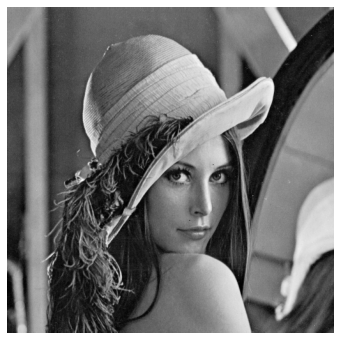

In [8]:
lena = openImage("img/lena.png")
imshow(lena)

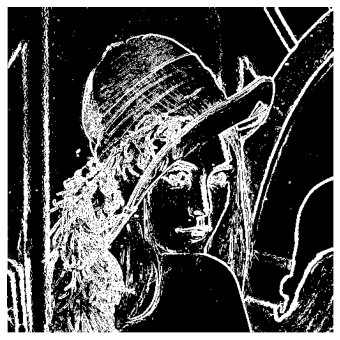

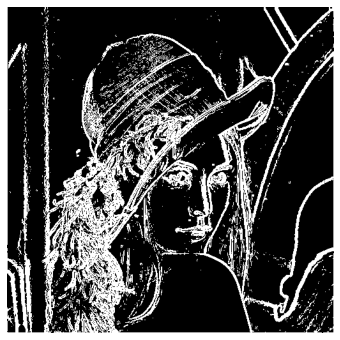

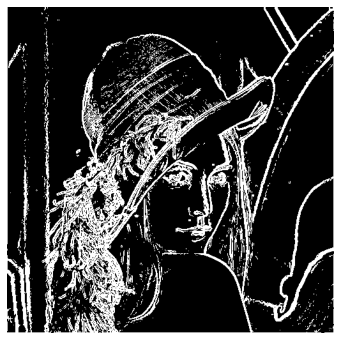

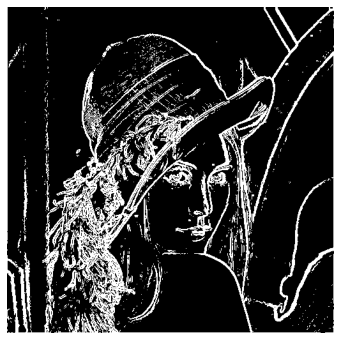

In [8]:
imshow(SobelDetector(lena, 60))
imshow(SobelDetector(lena, 70))
imshow(SobelDetector(lena, 80))
imshow(SobelDetector(lena, 90))

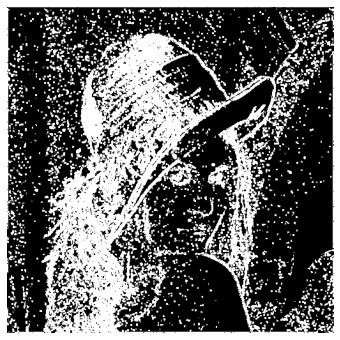

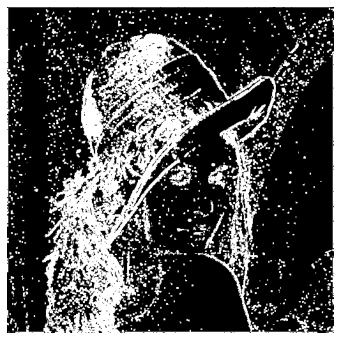

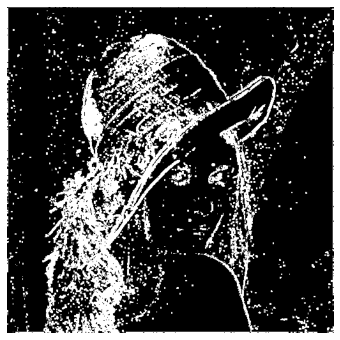

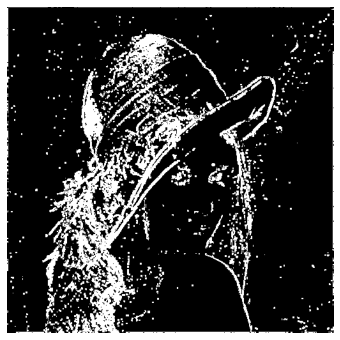

In [9]:
imshow(LaplacianDetector(lena, 60))
imshow(LaplacianDetector(lena, 70))
imshow(LaplacianDetector(lena, 80))
imshow(LaplacianDetector(lena, 90))

We can find a threshold around 80 that allows us to detect clear edges with the Sobel filter.
Because it uses second-order derivative, the Laplacian filter is highly sensitive to the noise. Due to that, the more we increase the threshold, the more we remove noise, doing that we lose details for the edges.
A good solution would be to apply a smooth filter before processing.

## Exercice 2: Non maximum suppression

This exercice addresses the problem of a unique localization of edges from a map determined by first order filters. This can be obtained by applying a non maximum suppression technique: the norm of an edge gradient should be maxima in the direction of the gradient. To this end, we provide the function `orientation(Ix,Iy,Ig)` that determines from spatial derivatives $I_x$, $I_y$ (using your favorite filters) and the gradient norm $I_g$ the orientation of the gradient for each pixels. Possible orientations are $0$, $\frac\pi4$, $\frac\pi2$ and $\frac{3\pi}4$ respectively coded by values 1, 2, 3 and 4 (0 stands for null gradient). Orientation of gradient are determined in the direct orthonormal basis.

1. Display the output of function `orientation()` applied on image `img/tools.png`. Verify values according to the different local orientation configurations (use `imshow_hot()` in interactive mode in the nootebook to see pixels value pointed by the mouse screen).

<IPython.core.display.Javascript object>


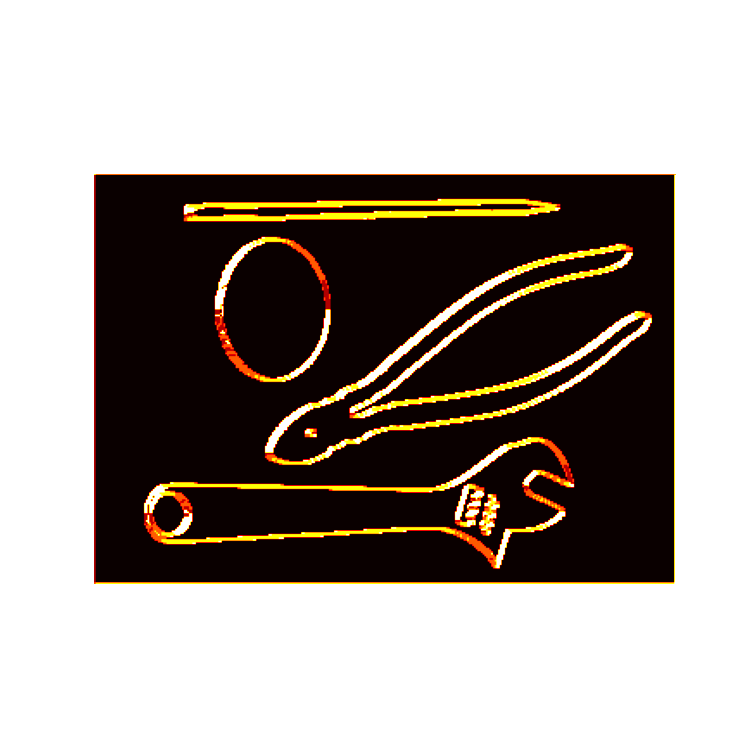

In [9]:
%matplotlib notebook
#### your answer below
tools = openImage("img/tools.png")
Sx = np.array([[1, 0, -1], 
               [2, 0, -2], 
               [1, 0, -1]])
Sy = np.array([[1, 2, 1], 
               [0, 0, 0], 
               [-1, -2, -1]])

def getNormAndOrientation(I, Sx, Sy): 
    Ix = convolve2d(I, Sx, mode='same')
    Iy = convolve2d(I, Sy, mode='same')
    
    norm = np.sqrt( Ix**2 + Iy ** 2)
    ori = orientation(Ix, Iy, norm)
    return norm, ori

Ig, Ior = getNormAndOrientation(tools, Sx, Sy)
imshow_hot(Ior)


Explain the different values given to a pixel by `orientation()`:

If a pixel has the same colour that his neighboor, that means that their gradients both have the same direction.
The white-ish colour means a $\theta$ = 0, and the red-ish colour means a $\theta$ = 3

2. Write a function `G=nms(Ig, Ior)` getting the gradient norm of an image, and the gradient orientation and returning an image of norm gradient for pixels being a local maxima of gradient norm in the direction of gradient or 0 otherwise. In other words, pixel `(i,j)` is a local maxima if `G[i,j] > 0` and `G[i,j]` gives the gradient norm value at this pixel.

In [12]:
def nms(Ig, Ior):
    """ Array**2 -> Array """
    Igbis = np.zeros((Ig.shape[0], Ig.shape[1]))
    # Image edges will be modified if needed, but not iterated upon
    for i in range(1,Ig.shape[0]-1):
        for j in range(1,Ig.shape[1]-1):
            if Ior[i,j] > 0.0:
                norm = Ig[i,j]
                di = Ior[i,j]
                # Cases
                # Horizontal
                if di == 3.0:
                    if Ig[i,j] > Ig[i+1,j] and Ig[i,j] > Ig[i-1,j] :
                        Igbis[i,j] = Ig[i,j]
                # 1st Diagonal
                if di == 4.0:
                    if Ig[i,j] > Ig[i+1,j+1] and Ig[i,j] > Ig[i-1,j-1] :
                        Igbis[i,j] = Ig[i,j]
                # Vertical
                if di == 1.0:
                    if Ig[i,j] > Ig[i,j+1] and Ig[i,j] > Ig[i,j-1] :
                        Igbis[i,j] = Ig[i,j]
                # And Diagonal
                if di == 2.0:
                    if Ig[i,j] > Ig[i+1,j-1] and Ig[i,j] > Ig[i-1,j+1] :
                        Igbis[i,j] = Ig[i,j]
    return Igbis    

3. Experiments function `nms()` on images `img/tools.png` and `img/lena.png` after apply or not a gaussian filter (use the function `gaussianKernel()` given in the previous TME).


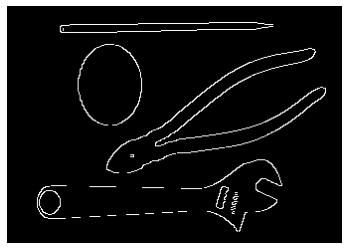

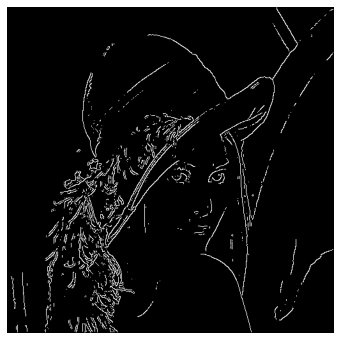

In [13]:
%matplotlib inline
### your answer below
Ig, Ior = getNormAndOrientation(tools, Sx, Sy)
toolsNMS = nms(Ig, Ior)
imshow(thresholdImage(toolsNMS, 200))

Ig, Ior = getNormAndOrientation(lena, Sx, Sy)
lenaNMS = nms(Ig, Ior)
imshow(thresholdImage(lenaNMS, 200))

**The function returns quite a precise contouring although it is incomplete. So, let's try again, this time applying some gaussian filter before removing non-maximas.**

<ipython-input-3-0f6de8141441>:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  n2 = np.int(np.ceil(3*sigma))



 smoothed by $\sigma$ = 0.1


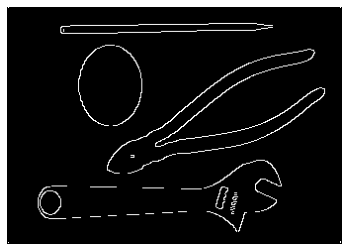

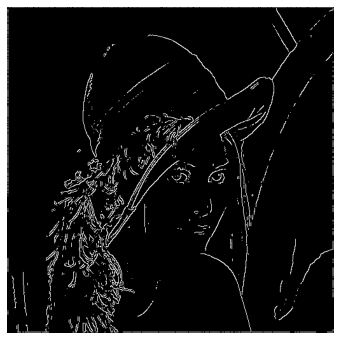


 smoothed by $\sigma$ = 0.6


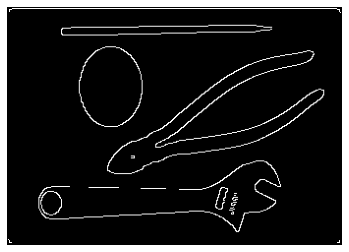

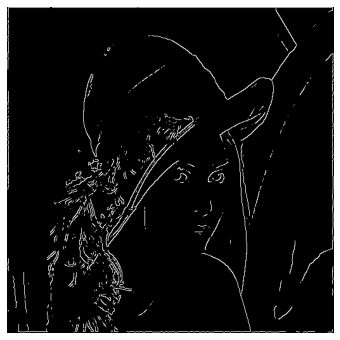


 smoothed by $\sigma$ = 1.1


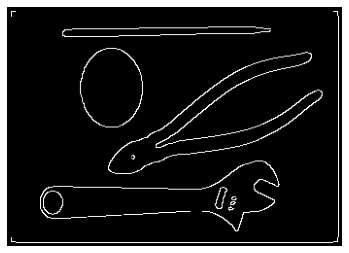

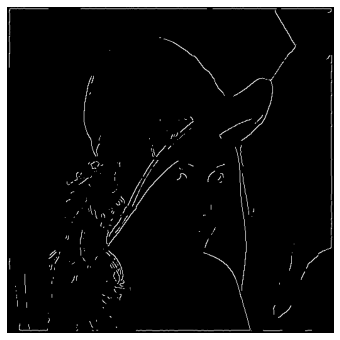


 smoothed by $\sigma$ = 1.6


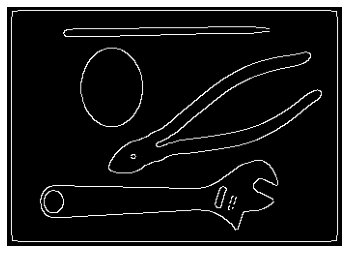

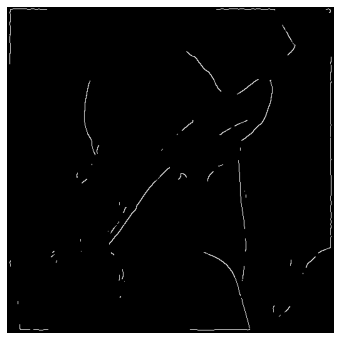


 smoothed by $\sigma$ = 2.1


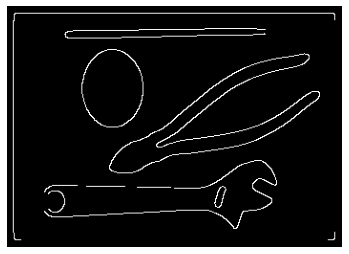

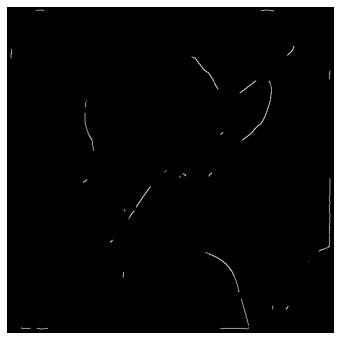


 smoothed by $\sigma$ = 2.6


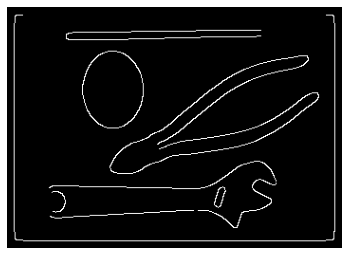

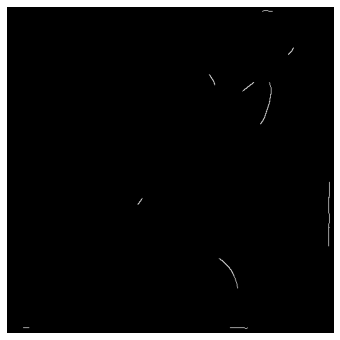

In [14]:
for s in np.arange(0.1, 3, 0.5):
    kernel = gaussianKernel(s)
    lenaSmoothed = convolve2d(lena, kernel)
    toolsSmoothed = convolve2d(tools, kernel)
    print("\n",f'smoothed by $\sigma$ = {s}')
    Ig, Ior = getNormAndOrientation(toolsSmoothed, Sx, Sy)
    toolsNMS = nms(Ig, Ior)
    imshow(thresholdImage(toolsNMS, 200))
    Ig, Ior = getNormAndOrientation(lenaSmoothed, Sx, Sy)
    lenaNMS = nms(Ig, Ior)
    imshow(thresholdImage(lenaNMS,200))

4. Conclude on the effect of smoothing (value of $\sigma$) on the edge detection process and on the size of edges.

**Gaussian filters helps reducing noise, but the non-maxima removal method is not that sensitive to it.**  
**Instead, smoothing the images messes up with orientation detection, and with gradient calculation, hence resulting in fewer detected edges for increasing values of $\sigma$.**

## Exercice 3:  Effects of smoothing in edge detection
Edge detectors are high pass filters and then amplify noise. To avoid this issue, we apply low pass filter, such as Gaussian filter, as preprocess. In this exercice, we use the image `img/lena.png`.

1. Smooth image `lena` by convolving with $G_\sigma$, the gaussian kernel of standard deviation $\sigma = 2$.

<ipython-input-2-0f6de8141441>:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  n2 = np.int(np.ceil(3*sigma))


<IPython.core.display.Javascript object>


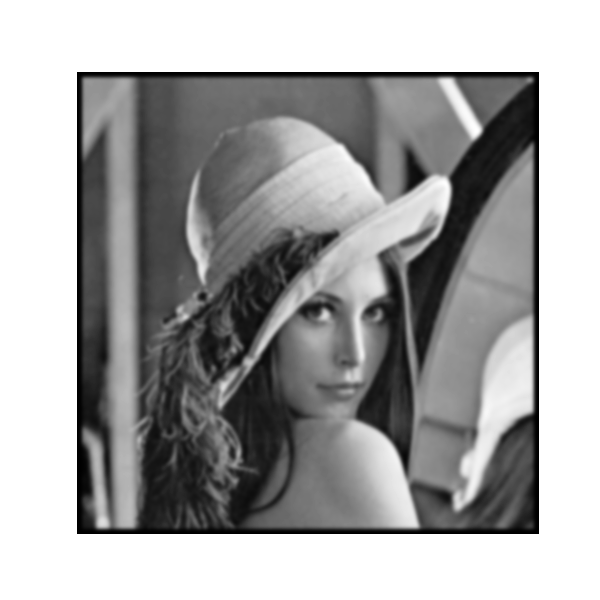

In [9]:
lenaSmoothed = convolve2d(lena, gaussianKernel(2))
imshow(lenaSmoothed)

2. On the smoothed image apply Sobel and Laplacian edge detectors. Find threshold values (around 10 for Laplacian and 200 for Sobel) in order the two detectors approximately detect the same contours. After smoothing, what are the main difference between the two detectors.

<IPython.core.display.Javascript object>


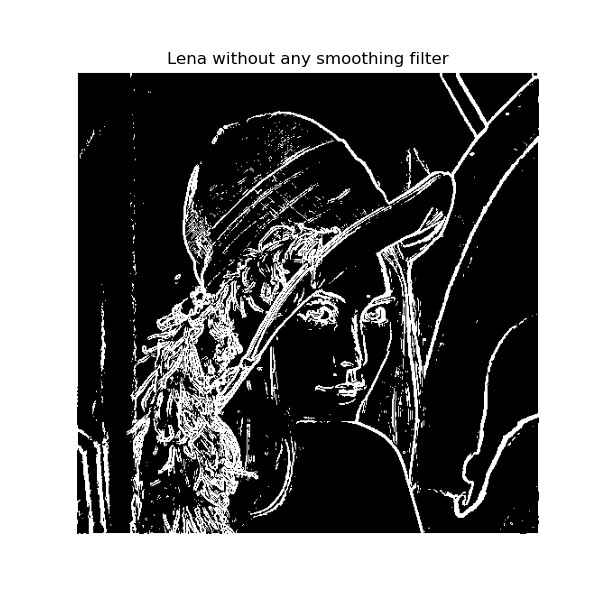

<IPython.core.display.Javascript object>


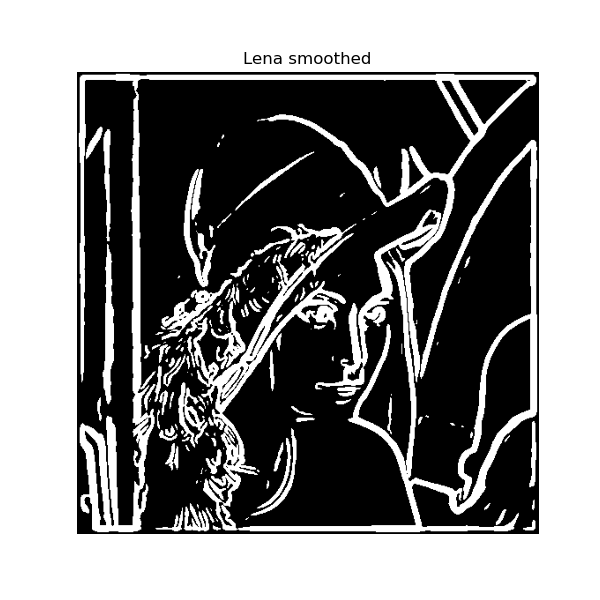

In [10]:
imshow(SobelDetector(lena, 100), 'Lena without any smoothing filter')
imshow(SobelDetector(lenaSmoothed, 50), 'Lena smoothed')

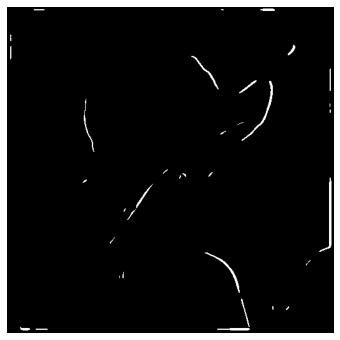

In [17]:
imshow(SobelDetector(lenaSmoothed, 200))

<IPython.core.display.Javascript object>


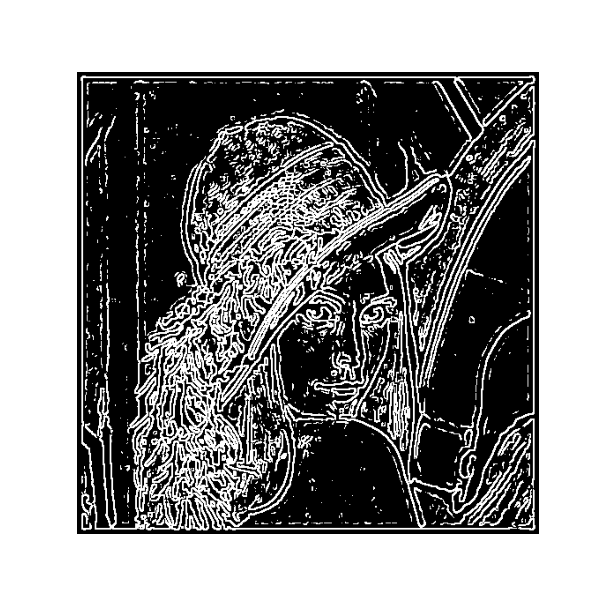

<IPython.core.display.Javascript object>


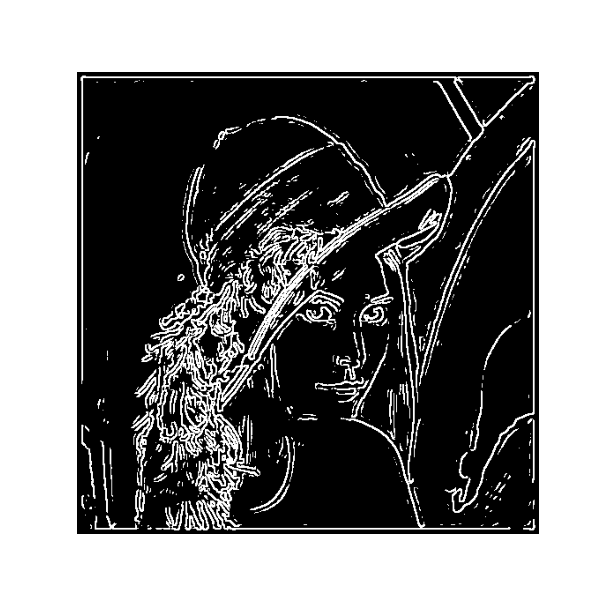

<IPython.core.display.Javascript object>


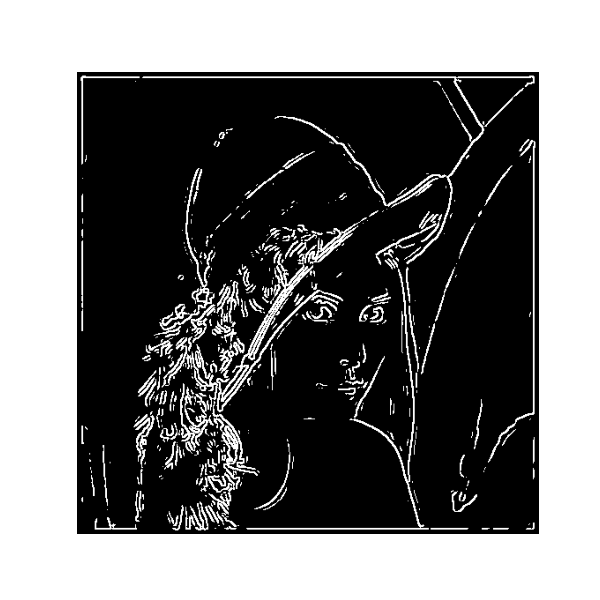

In [11]:
imshow(LaplacianDetector(lenaSmoothed, 1))
imshow(LaplacianDetector(lenaSmoothed, 3))
imshow(LaplacianDetector(lenaSmoothed, 5))

When we use the Sobel filter after smoothing the image, the noise is cancelled but we cannot precisely determine the localisation of contours.
For the Laplacian filter, the edges are still precise, but with more noise, if we increase the value of the threshold to remove more noise, we lose some contours.

3. Let vary $\sigma\in[\sigma_1, \sigma_2]$ ($\sigma_1$ and $\sigma_2$ to be determined) and analyze results obtained for both detectors. What are the effects of smoothing on the noise ? on the localisation of contours ?

<ipython-input-2-0f6de8141441>:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  n2 = np.int(np.ceil(3*sigma))


<IPython.core.display.Javascript object>


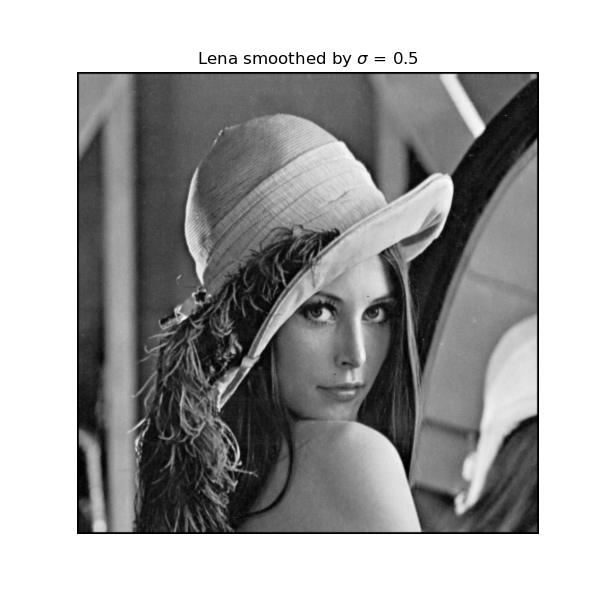

<IPython.core.display.Javascript object>


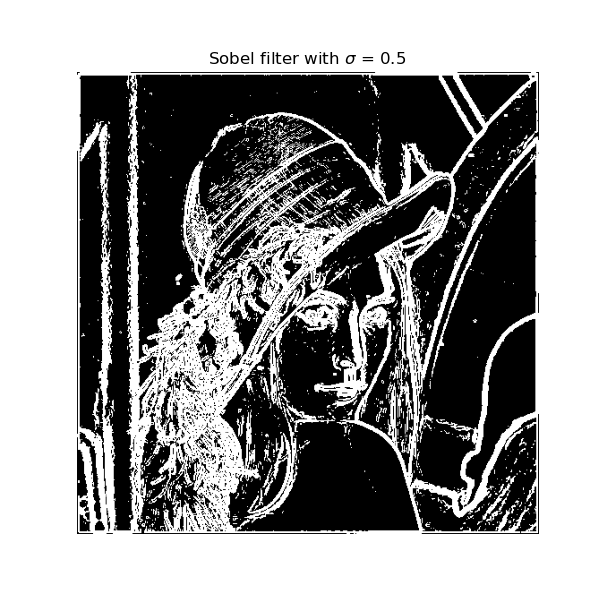

<IPython.core.display.Javascript object>


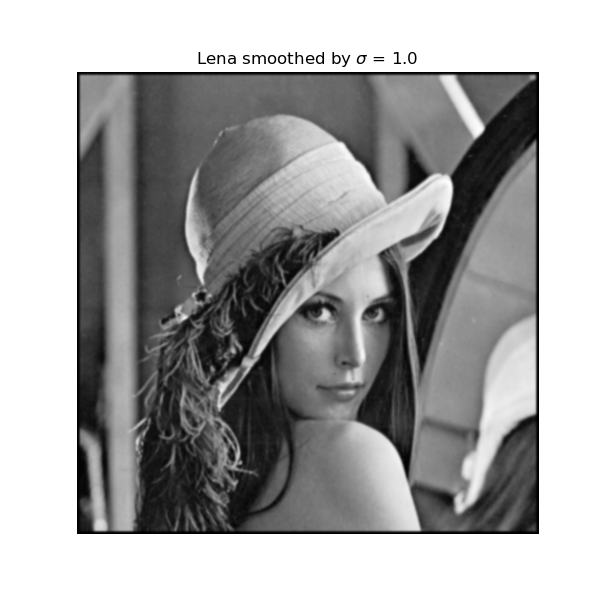

<IPython.core.display.Javascript object>


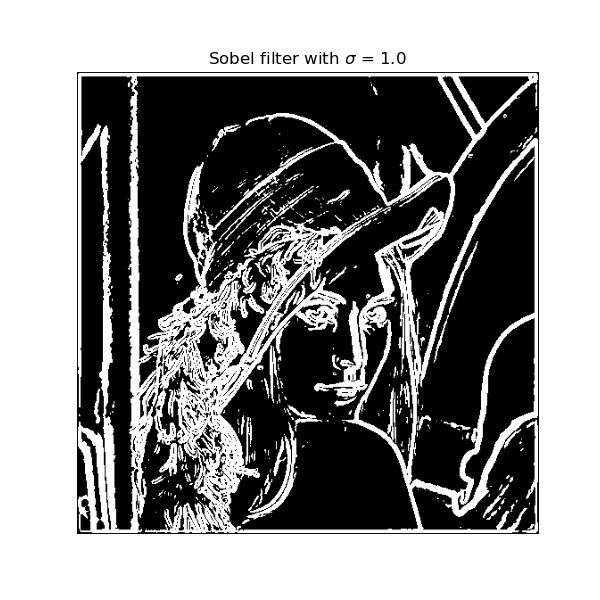

<IPython.core.display.Javascript object>


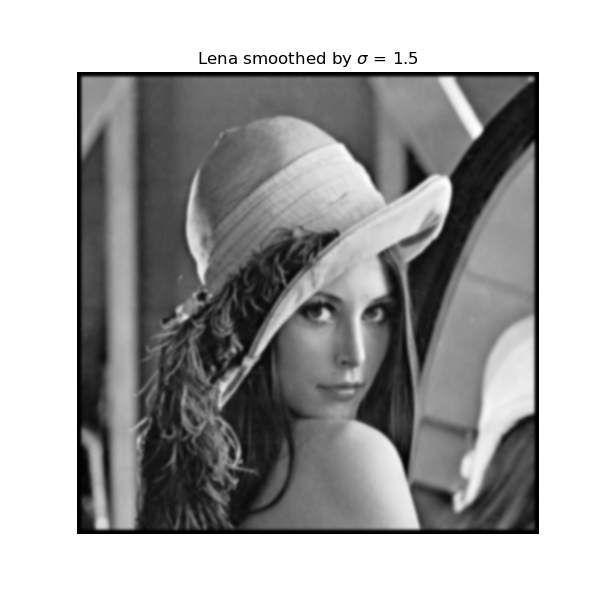

<IPython.core.display.Javascript object>


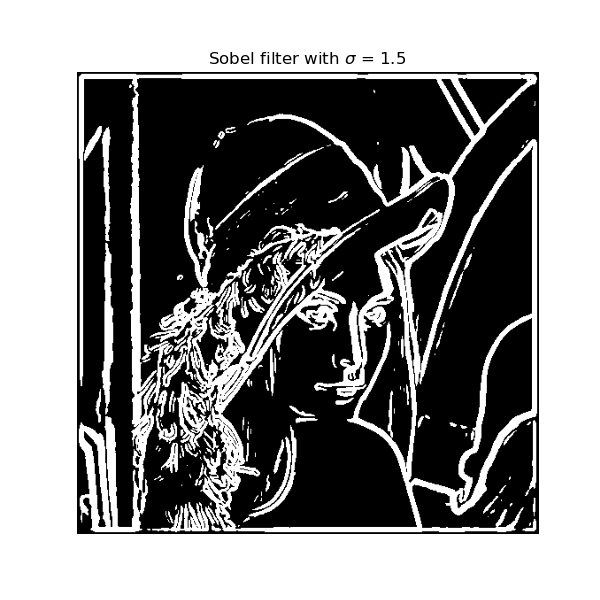

<IPython.core.display.Javascript object>


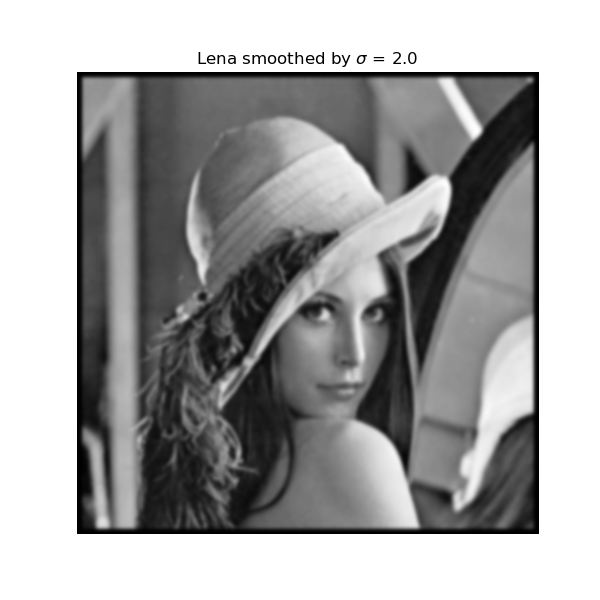

<IPython.core.display.Javascript object>


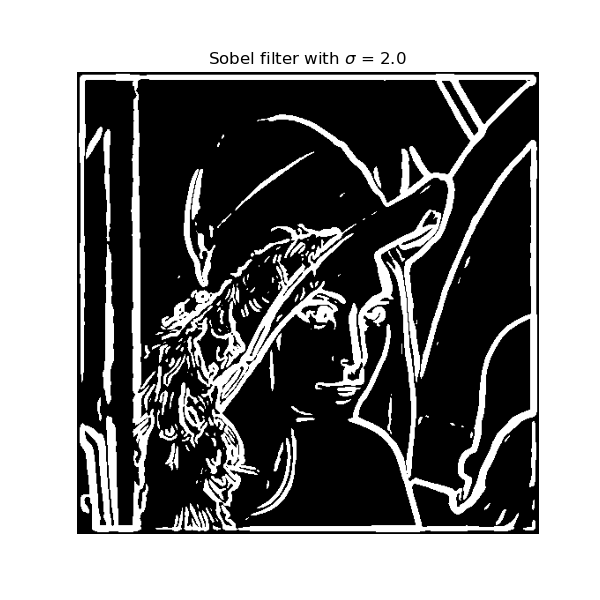

<IPython.core.display.Javascript object>


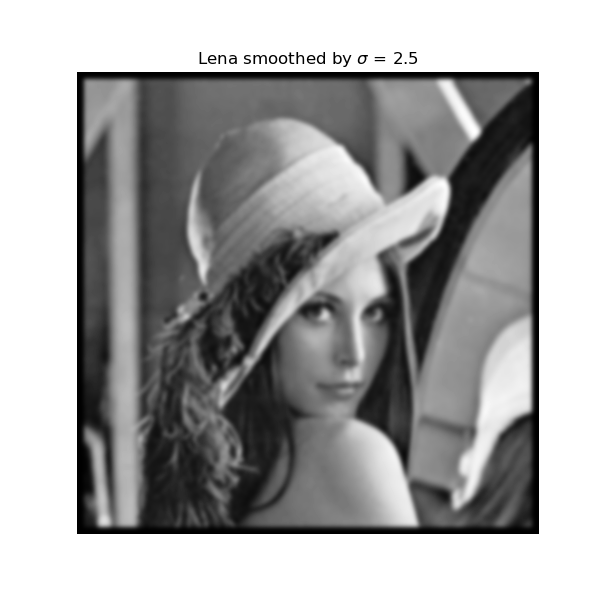

<IPython.core.display.Javascript object>


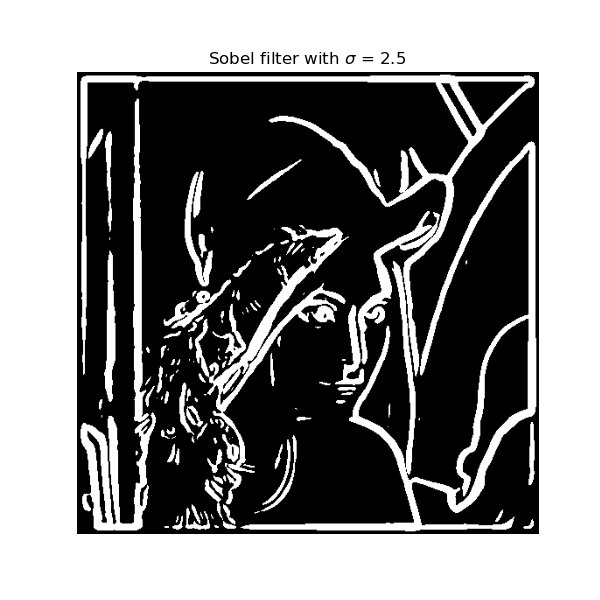

In [18]:
for s in np.arange(0.5, 3, 0.5):
    kernel = gaussianKernel(s)
    lenaSmoothed = convolve2d(lena, kernel)
    imshow(lenaSmoothed, f'Lena smoothed by $\sigma$ = {s}')
    imshow(SobelDetector(lenaSmoothed, 50), f'Sobel filter with $\sigma$ = {s}')

For the Sobel Filter, a great value for the $\sigma$ would be between 1.0 and 1.5, this would remove enough noise without losing too much information about the contours.

<ipython-input-2-0f6de8141441>:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  n2 = np.int(np.ceil(3*sigma))


<IPython.core.display.Javascript object>


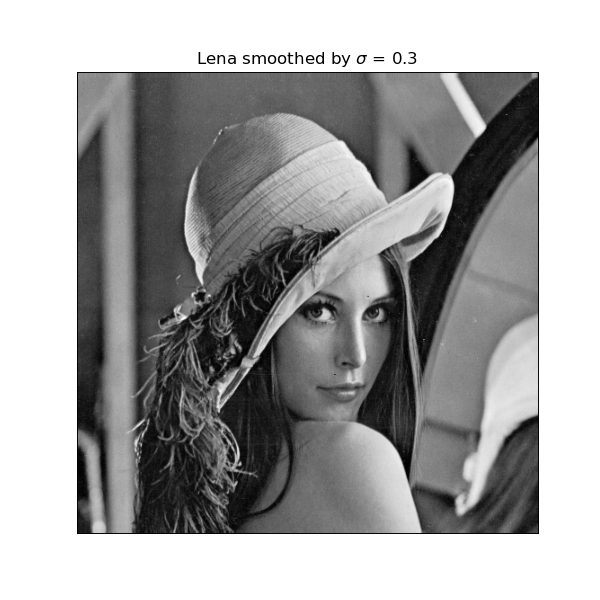

<IPython.core.display.Javascript object>


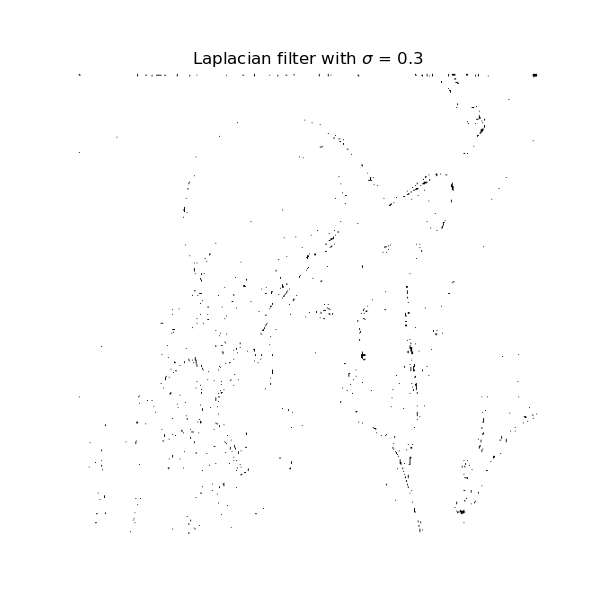

<IPython.core.display.Javascript object>


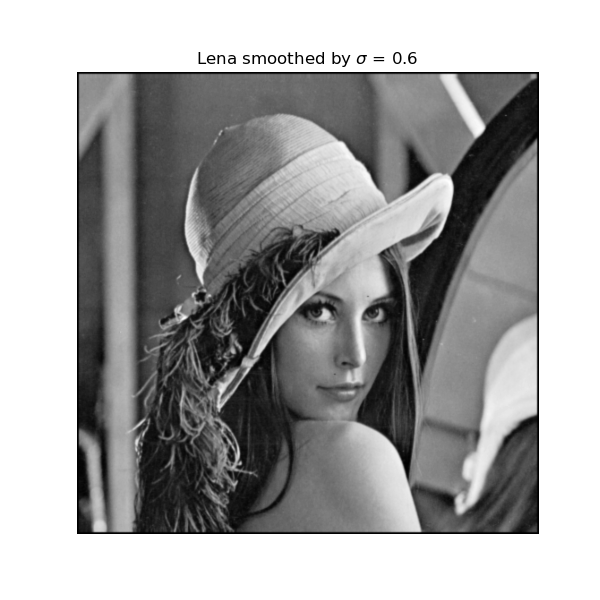

<IPython.core.display.Javascript object>


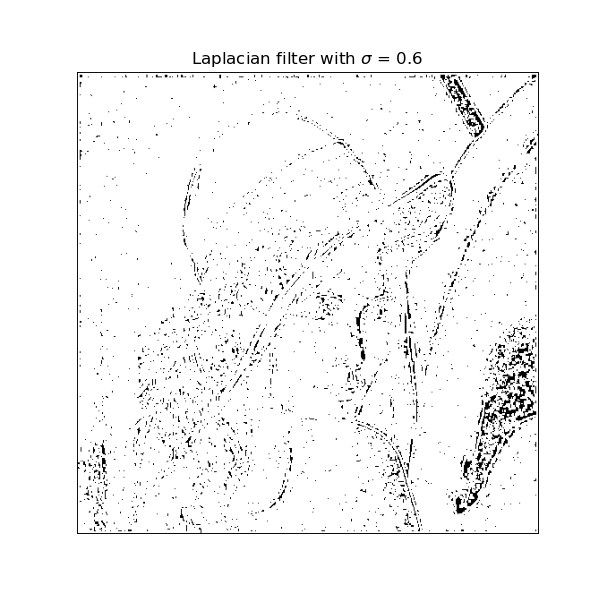

<IPython.core.display.Javascript object>


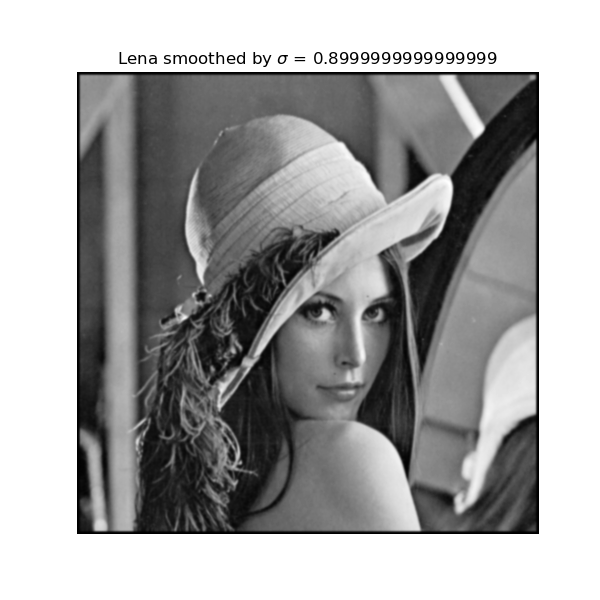

<IPython.core.display.Javascript object>


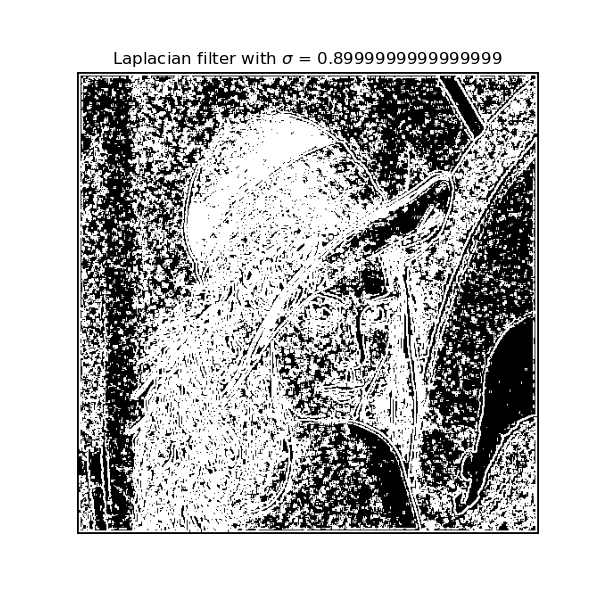

<IPython.core.display.Javascript object>


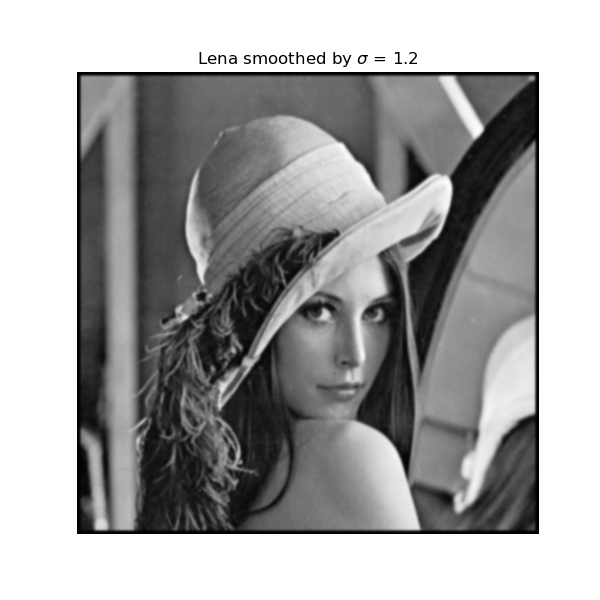

<IPython.core.display.Javascript object>


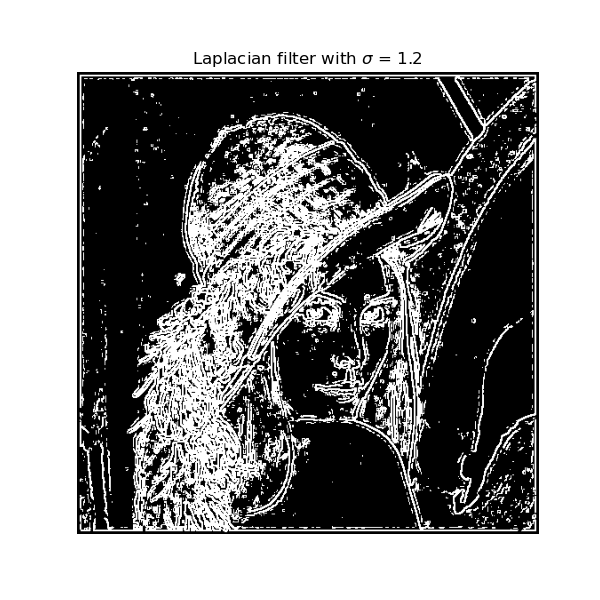

<IPython.core.display.Javascript object>


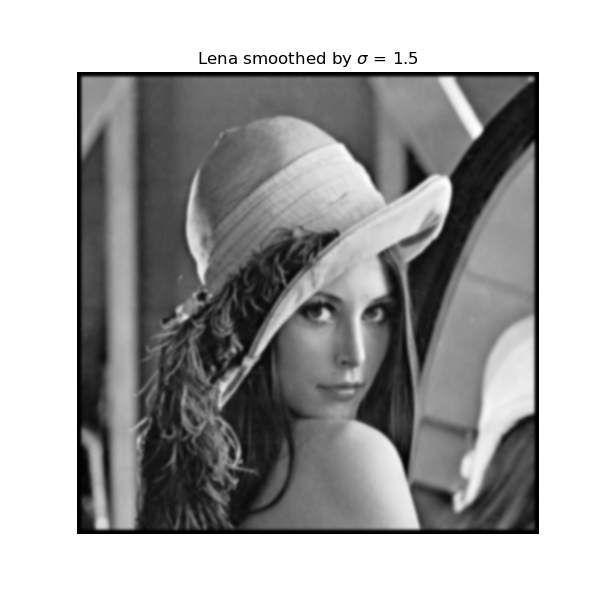

<ipython-input-2-0f6de8141441>:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(size//80, size//80))


<IPython.core.display.Javascript object>


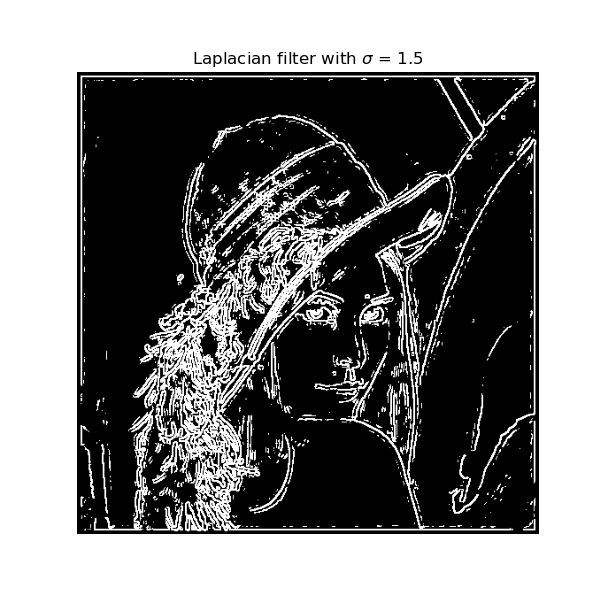

<IPython.core.display.Javascript object>


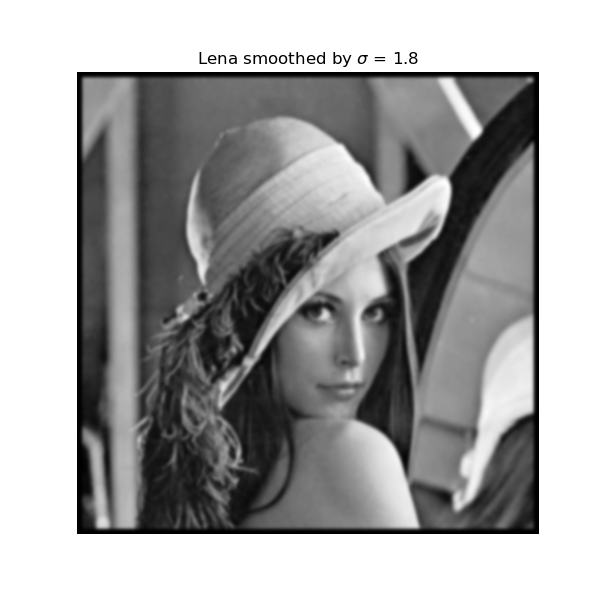

<IPython.core.display.Javascript object>


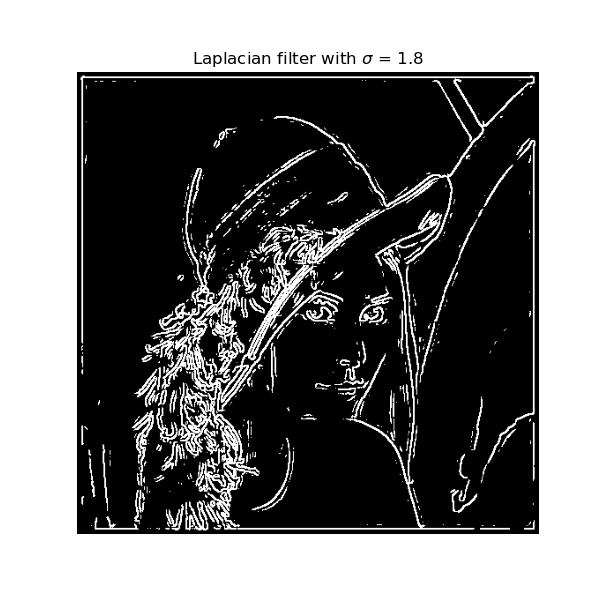

<IPython.core.display.Javascript object>


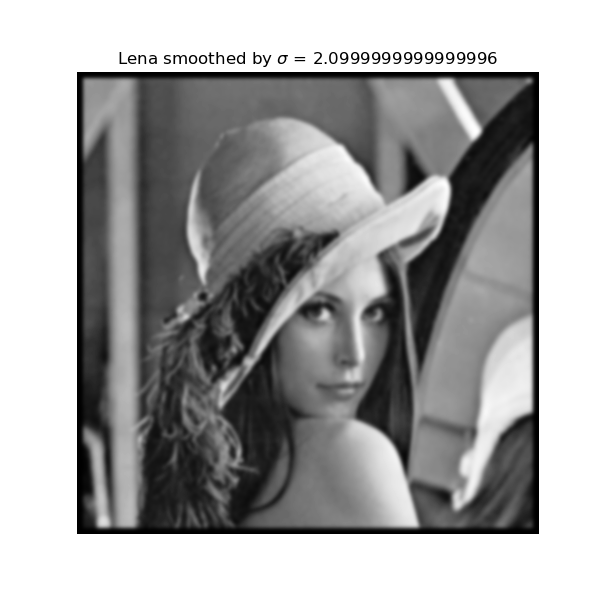

<IPython.core.display.Javascript object>


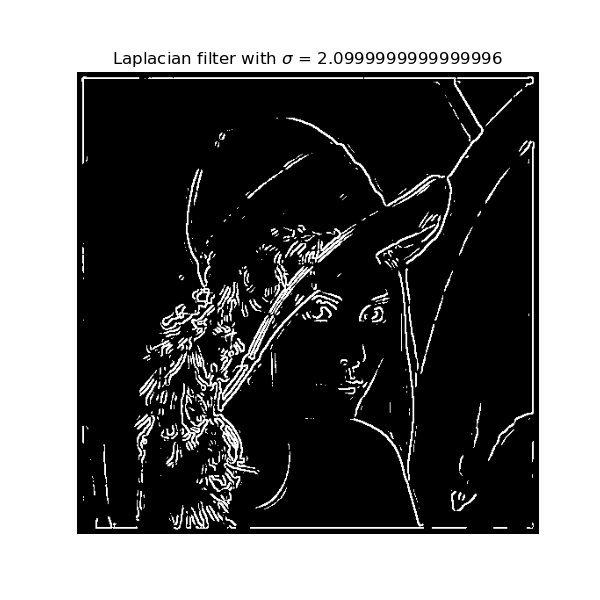

<IPython.core.display.Javascript object>


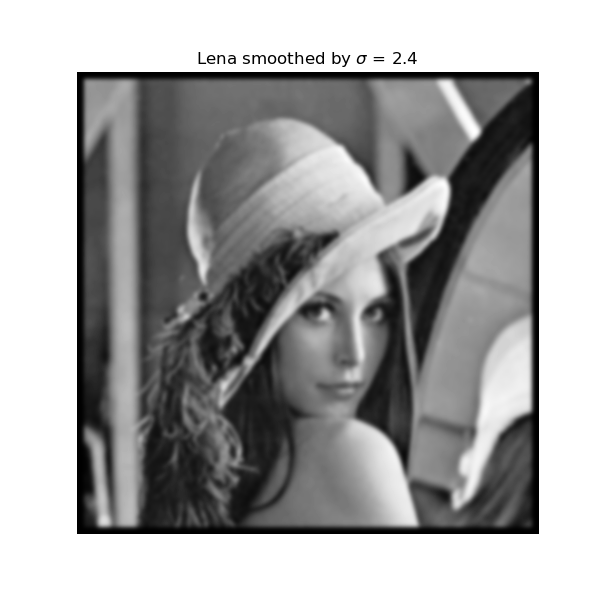

<IPython.core.display.Javascript object>


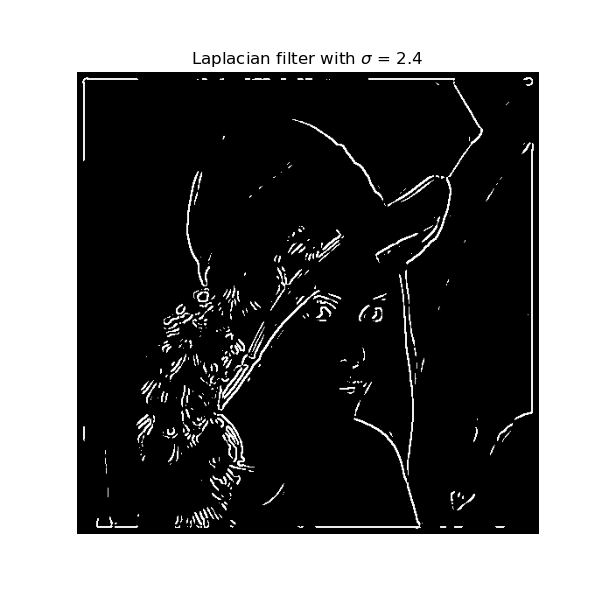

<IPython.core.display.Javascript object>


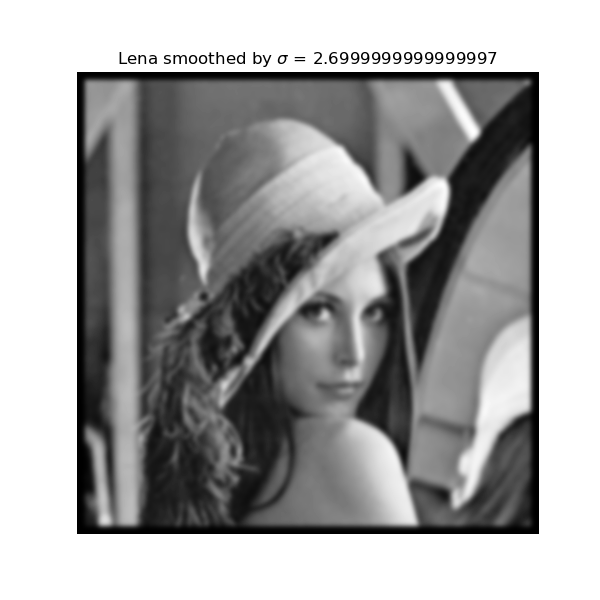

<IPython.core.display.Javascript object>


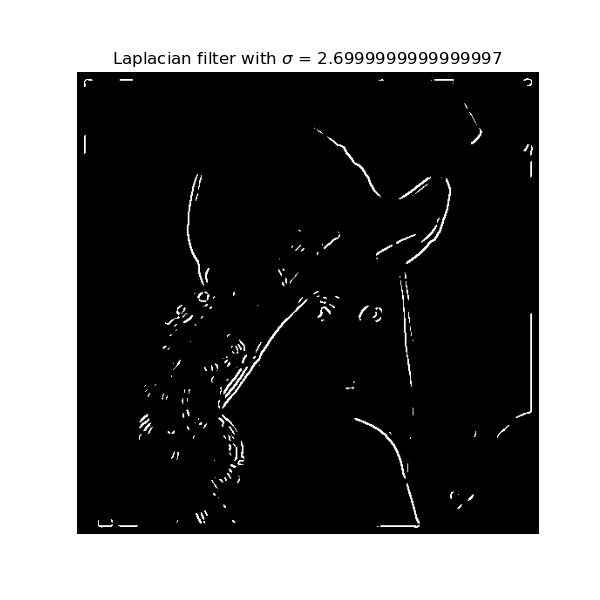

<IPython.core.display.Javascript object>


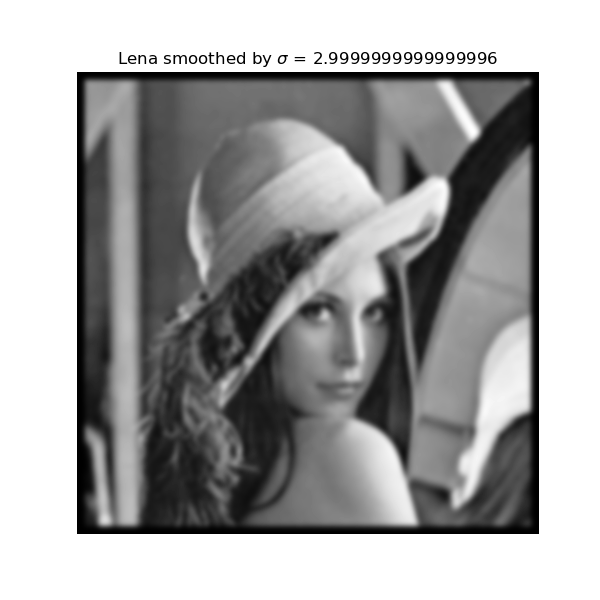

<IPython.core.display.Javascript object>


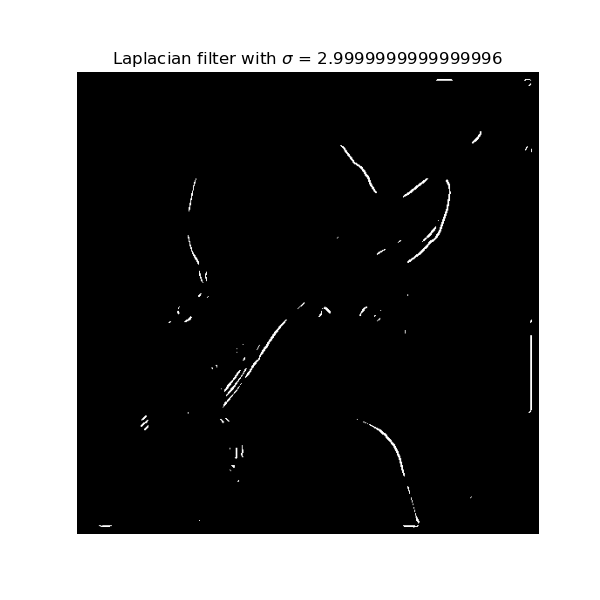

In [20]:
for s in np.arange(0.3, 3, 0.3):
    kernel = gaussianKernel(s)
    lenaSmoothed = convolve2d(lena, kernel)
    imshow(lenaSmoothed, f'Lena smoothed by $\sigma$ = {s}')
    imshow(LaplacianDetector(lenaSmoothed, 5), f'Laplacian filter with $\sigma$ = {s}')

For the Laplacian filter, a good balance for $\sigma$ between the noise cancelling and the thinness of the contours would be around 1.6. Smooth enough to remove noise but not too much to keep information on the edges detection.

The more we increase the value of $\sigma$, the less noise there is after applying those two filters. By doing that, we increase the thickness of contours for the Sobel filter, and we lose some of them for the Laplacian filter. 

4. Replace the gaussian filter by a constrast enhancer filter of impulse response $\begin{pmatrix} 0&-1&0\\-1&5&-1\\0&-1&0\end{pmatrix}$ (other choices are possible). Discuss the results.

<IPython.core.display.Javascript object>


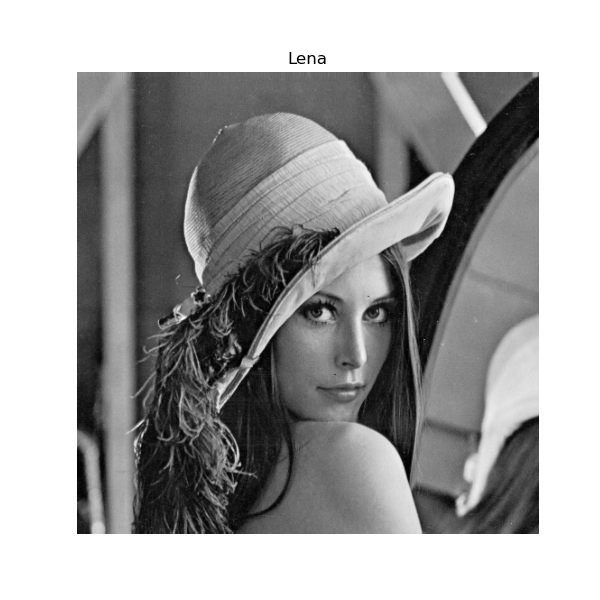

<IPython.core.display.Javascript object>


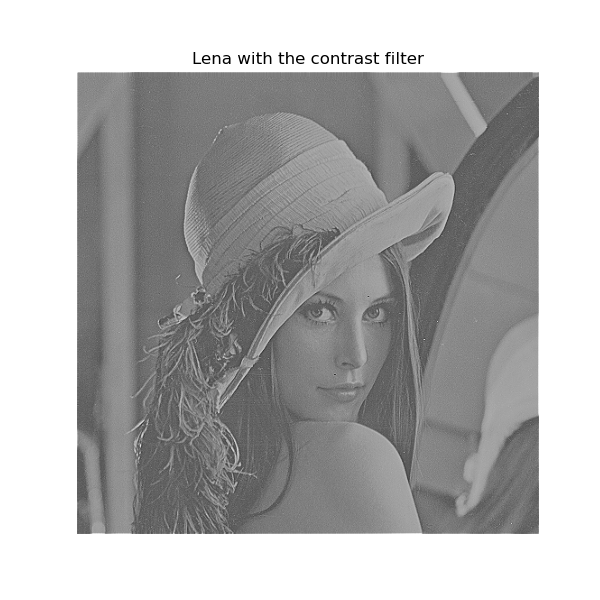

<IPython.core.display.Javascript object>


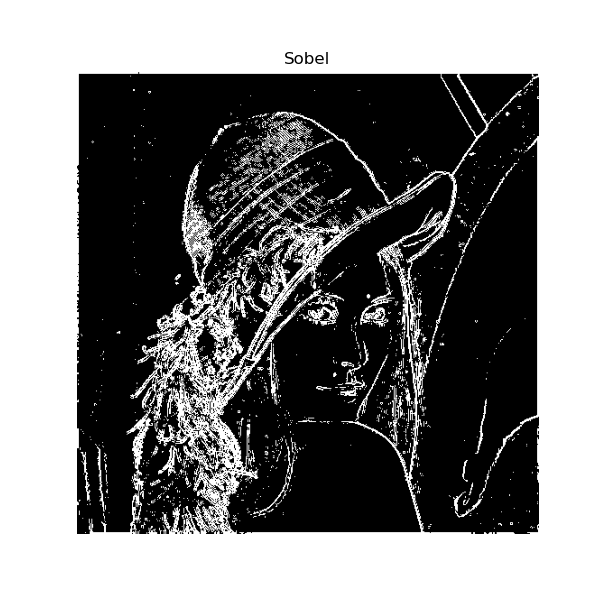

<IPython.core.display.Javascript object>


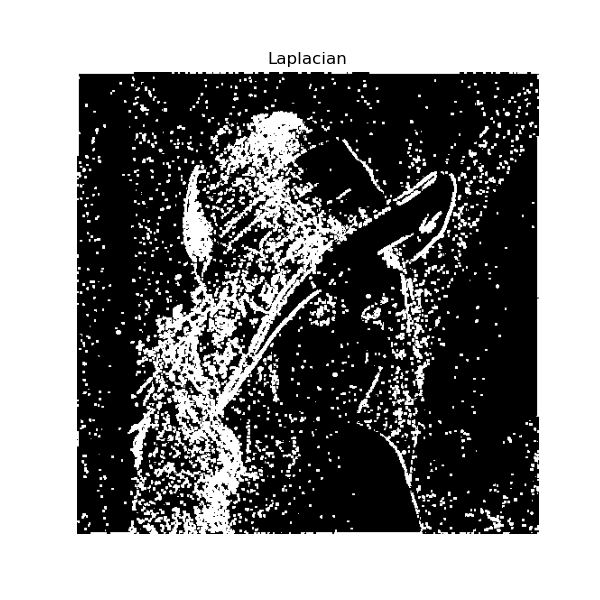

In [26]:
f = np.array([[0, -1, 0],
                [-1, 5, -1], 
                [0, -1, 0]])
If = convolve2d(lena, f, mode='same')
imshow(lena, 'Lena')
imshow(If, 'Lena with the contrast filter')
imshow(SobelDetector(If, 230), 'Sobel')
imshow(LaplacianDetector(If, 470), 'Laplacian')

Applaying this contrast filter require to highly increase the threshold. 
For the sobel filter, this help to have thin countours, but we cannot say much about the laplacian filter, for this one, there is still too much noise, contours are completly lost.

5. Apply a multiresolution decomposition up to a size $8\times8$. Apply the two detectors for each resolution. Discuss the results.

<IPython.core.display.Javascript object>


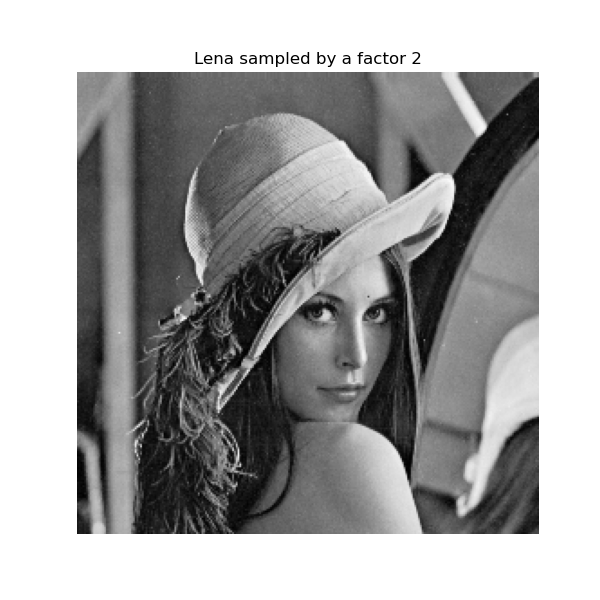

<IPython.core.display.Javascript object>


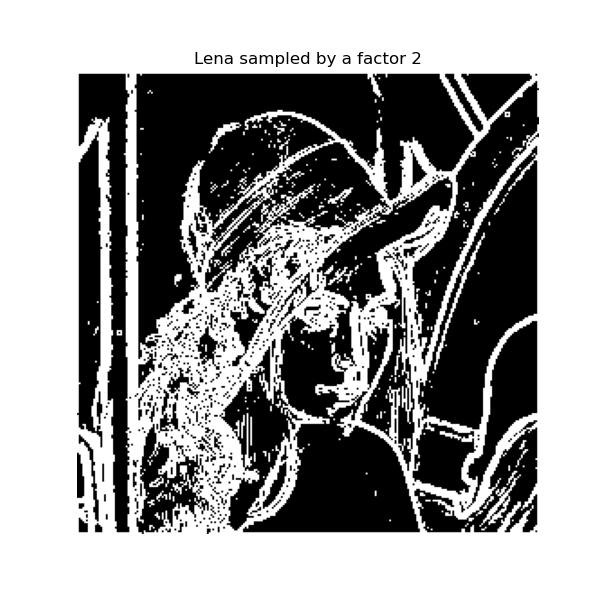

<IPython.core.display.Javascript object>


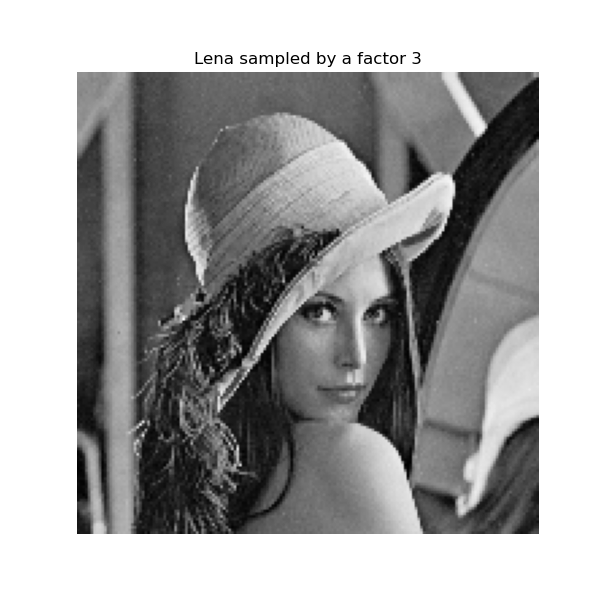

<IPython.core.display.Javascript object>


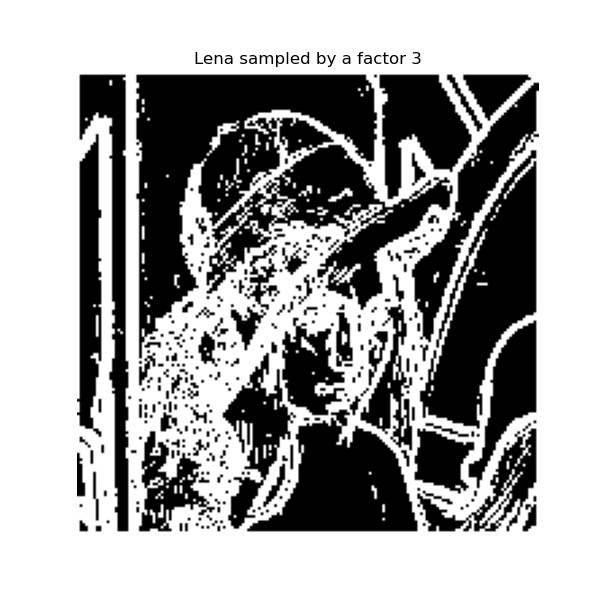

<IPython.core.display.Javascript object>


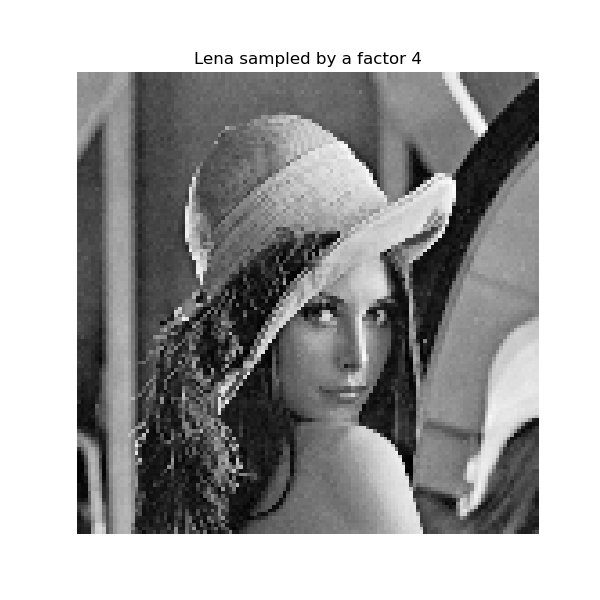

<IPython.core.display.Javascript object>


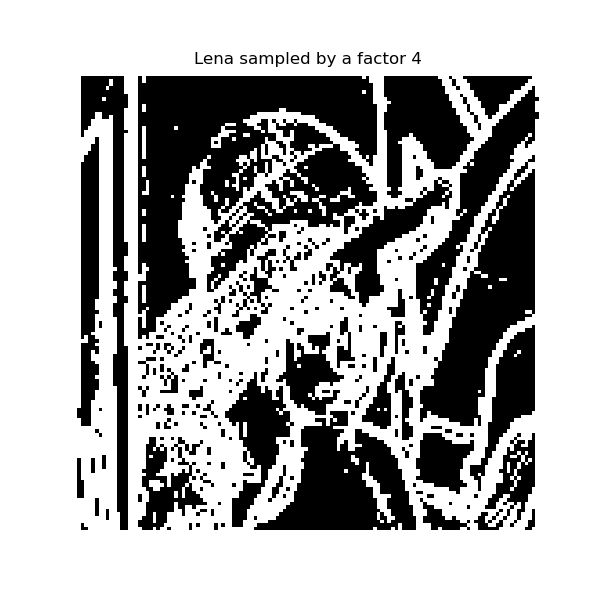

<IPython.core.display.Javascript object>


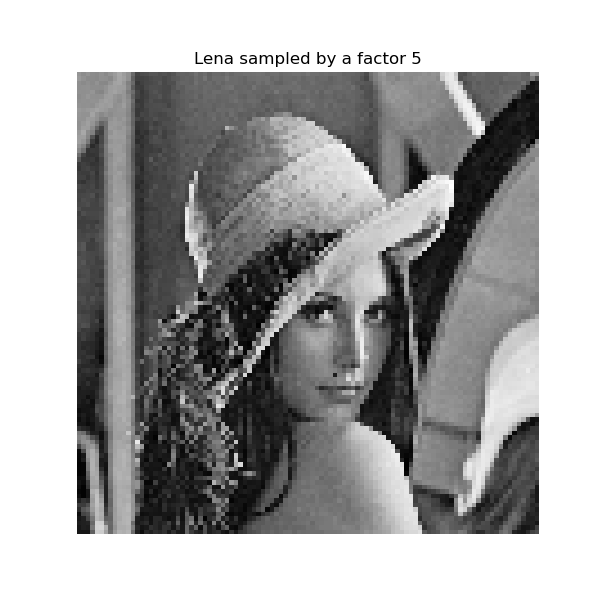

<IPython.core.display.Javascript object>


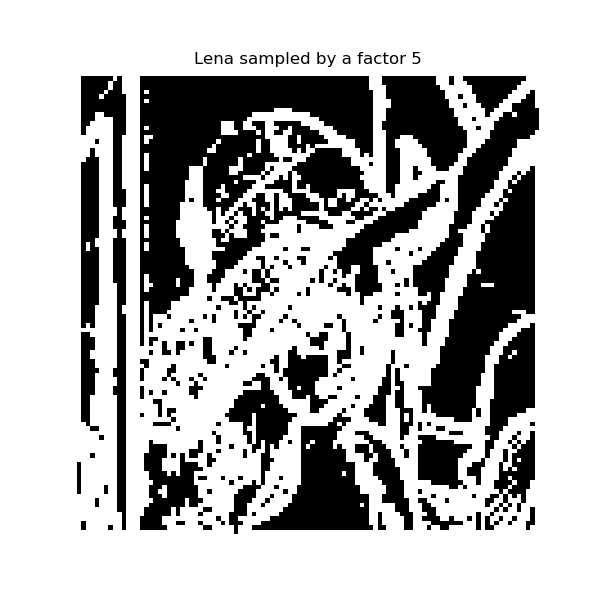

<IPython.core.display.Javascript object>


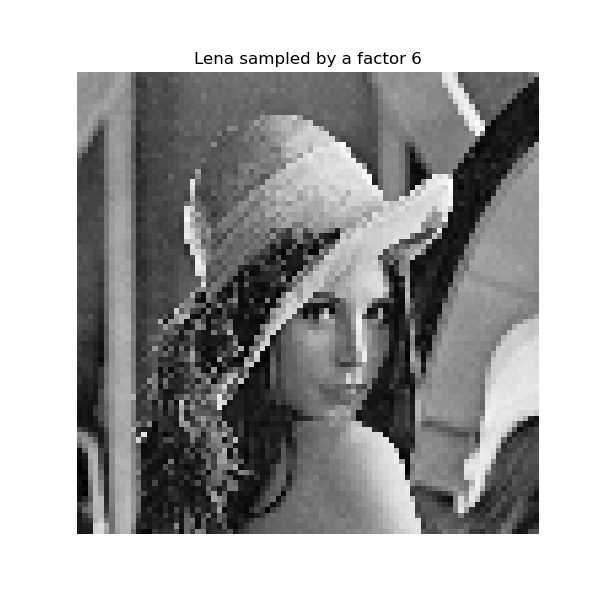

<IPython.core.display.Javascript object>


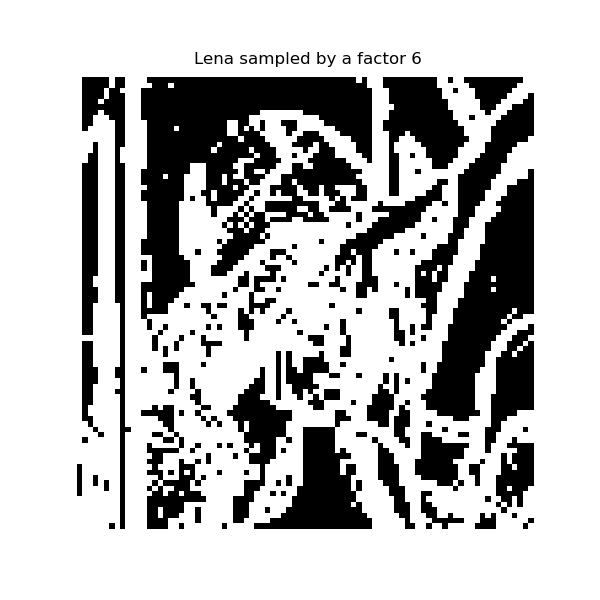

<IPython.core.display.Javascript object>


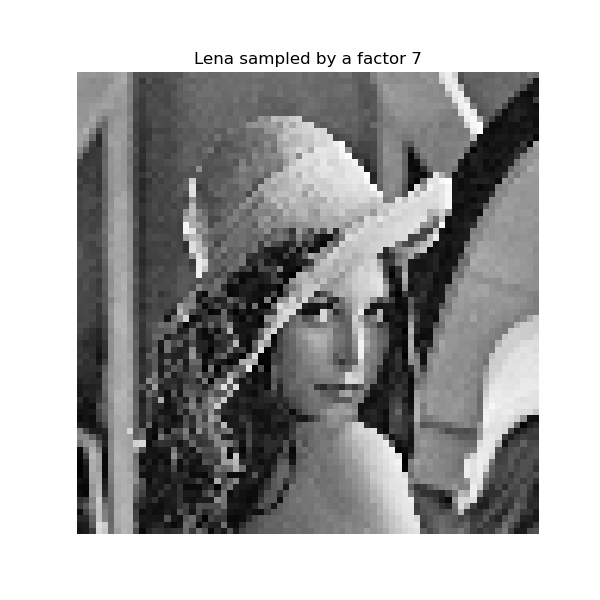

<IPython.core.display.Javascript object>


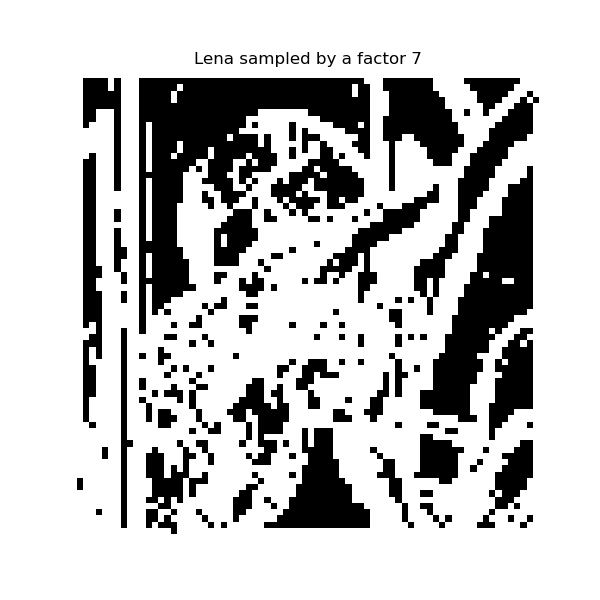

<IPython.core.display.Javascript object>


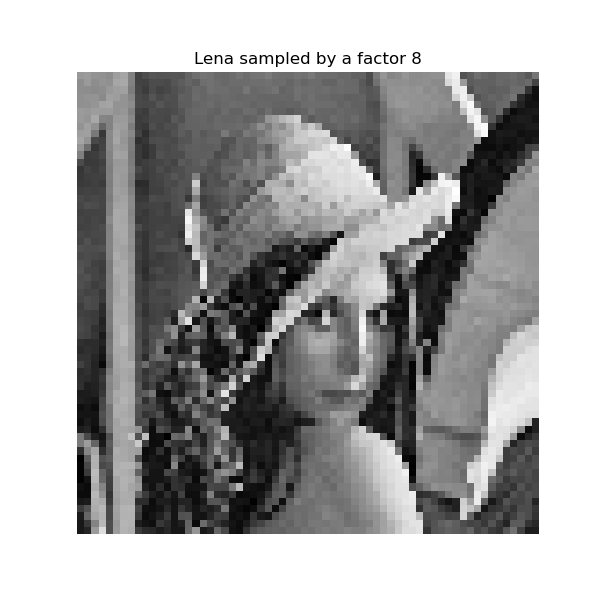

<IPython.core.display.Javascript object>


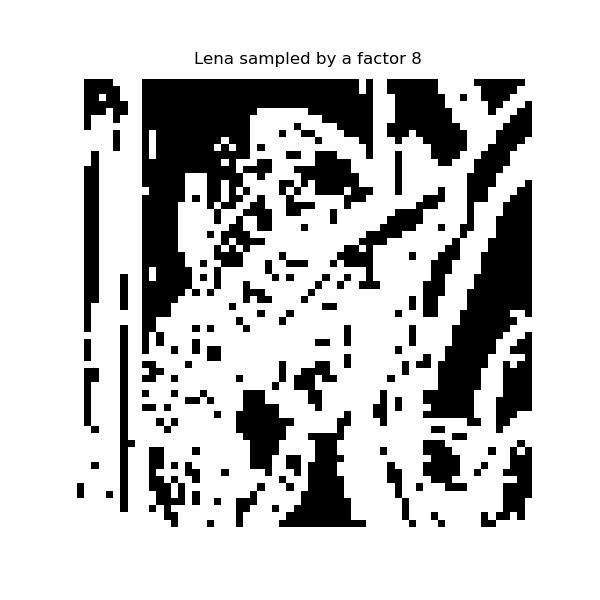

In [41]:
def subSample2(I, factor = 2):
    """ Array -> Array """
    return I[::factor,::factor]



for i in range(2, 9):
    lenaSampled = subSample2(lena, i)
    imshow(lenaSampled, f'Lena sampled by a factor {i}')
    imshow(SobelDetector(lenaSampled, 70), f'Lena sampled by a factor {i}')

We can clearly see that when we subsample an image, we lose precision on the contours. For a factor 2, this is still recognisable, but higher then that it is over. 

<IPython.core.display.Javascript object>


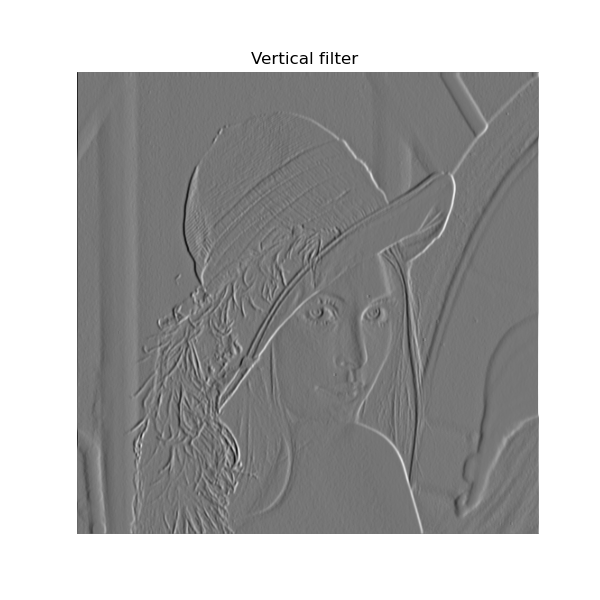

<IPython.core.display.Javascript object>


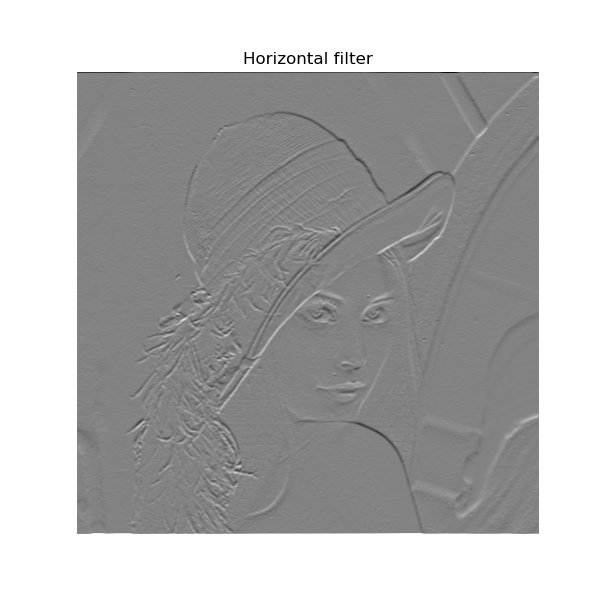

<IPython.core.display.Javascript object>


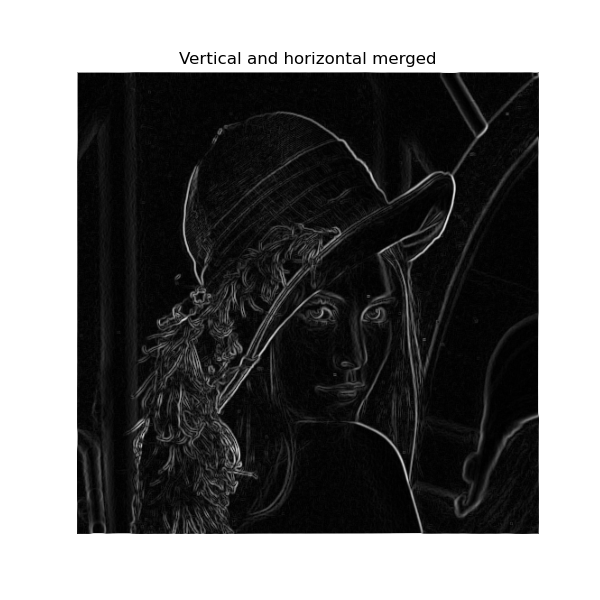

<IPython.core.display.Javascript object>


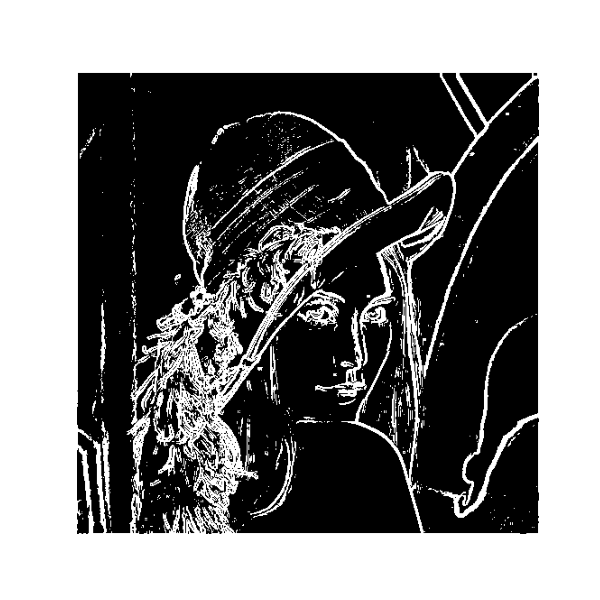

In [47]:
def PrewittDetector(I, s):
    """ Array*double -> Array """
    Sx = np.array([[-1, 0, 1], 
                   [-1, 0, 1], 
                   [-1, 0, 1]])
    Sy = np.array([[-1, -1, -1], 
                   [0, 0, 0], 
                   [1, 1, 1]])
    
    Ix = convolve2d(I, Sx, mode='same')
    Iy = convolve2d(I, Sy, mode='same')
    
    norm = np.sqrt( Ix**2 + Iy ** 2)
    
    return Ix, Iy
#     return thresholdImage(norm, s)

# imshow(PrewittDetector(lena, 70))
# imshow(SobelDetector(lena, 70))

lenaX, lenaY = PrewittDetector(lena, 60)
norm = np.sqrt( lenaX**2 + lenaY ** 2)

imshow(lenaX, 'Vertical filter ')
imshow(lenaY, 'Horizontal filter')
imshow(norm, 'Vertical and horizontal merged')

imshow(thresholdImage(norm, 70))